In [2]:
# load package
import matplotlib.pyplot as plt
import skimage
import matplotlib.image as mpig
from skimage.restoration import (denoise_wavelet, estimate_sigma)
from skimage import data, img_as_float
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio,structural_similarity
from skimage import io
from numpy import *
from numpy import linalg as la
from math import log10, sqrt
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sci
from sklearn.decomposition import PCA
import numpy as np

In [3]:
#loading pic and add noisy
#original = I[100:250, 50:300]
#original=I[:,:,:-1]
#original=I
#sigma = 0.15
#noisy_or = random_noise(original, var=sigma**2)

In [4]:
def sep_RGB(noisy_or):
    # R
    red=noisy_or[:,:,0]
    # G
    green=noisy_or[:,:,1]
    # B
    blue=noisy_or[:,:,2]

    fig,axes = plt.subplots(1,3,figsize=(12,7))
    axes[0].imshow(noisy_or[:,:,0])
    axes[0].set_title('R')
    axes[1].imshow(noisy_or[:,:,1])
    axes[1].set_title('G')
    axes[2].imshow(noisy_or[:,:,2])
    axes[2].set_title('B')

    plt.show()

    return red,green,blue

In [56]:
def pic(original,x,method):
    '''
    showing the pic, PSNR and SSIM
    ---
    input: pic matrix, denoising method
    output: plot
    '''
    psnr_noisy = peak_signal_noise_ratio(original, x)
    ssm_noisy=structural_similarity(original, x,channel_axis=-1)
    plt.imshow(x)
    plt.title(f'{method}\nPSNR={psnr_noisy:0.4g}'
         '\nSSIM=%0.4g' % ssm_noisy)
    plt.savefig(f'{method}.png')

In [6]:
def PCA_denoising(red,green,blue,n):
    '''
    Doing pca on RGB paths repectively
    ---
    input: noisy pic
    output: denoise pic
    '''
    import matplotlib.pyplot as plt
    import scipy.io as sci
    from sklearn.decomposition import PCA
    import numpy as np
    #initialize PCA with first  principal components
    pca = PCA(n,random_state=1)
    #Applying to red channel and then applying inverse transform to transformed array.
    red_transformed = pca.fit_transform(red)
    red_inverted = pca.inverse_transform(red_transformed)

    #Applying to Green channel and then applying inverse transform to transformed array.
    green_transformed = pca.fit_transform(green)
    green_inverted = pca.inverse_transform(green_transformed)

    #Applying to Blue channel and then applying inverse transform to transformed array.
    blue_transformed = pca.fit_transform(blue)
    blue_inverted = pca.inverse_transform(blue_transformed)

    x= np.dstack((red_inverted, green_inverted, blue_inverted))

    return x

In [7]:
def svd(img):
    '''
    Doing SVD on each 2D data
    ---
    input: one of RGB path
    output: one of RGB SVD path
    '''
    u, sigma, vt = la.svd(img)
    h, w = img.shape[:2]
    h1 = int(h * 0.1) #The first 10% singular value is used to reconstruct the image
    sigma1 = diag(sigma[:h1],0) #Generate a diagonal matrix with singular values
    u1 = zeros((h,h1), float)
    u1[:,:] = u[:,:h1]
    vt1 = zeros((h1,w), float)
    vt1[:,:] = vt[:h1,:]
    return u1.dot(sigma1).dot(vt1)

def SVD_denoising(red,green,blue):
    '''
    Doing SVD on pic
    ---
    input:RGB matrix
    output:pic after svd
    '''
    r=svd(red)
    g=svd(green)
    b=svd(blue)
    noisy_svd= np.dstack((r, g, b))
    return noisy_svd

In [8]:
def sigmaest(noisy):
    '''
    Estimate the average noise standard deviation across color channels.
    Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
    ---
    input: noisy pic
    output: estimated sigma
    '''
    sigma_est = estimate_sigma(noisy, channel_axis=-1, average_sigmas=True)
    print(f'Estimated Gaussian noise standard deviation = {sigma_est}')
    return sigma_est

In [26]:
def wavelet_denoise(noisy,sigma_est,method,original,picname):
    '''
    Doing Wavelet denoise
    ---
    input: noisy pic,estimated sigma of original noisy pic, dimension reduction method,pic name
    output: plot result, bayes denoise matrix, visu denoise matrix
    '''
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12, 8),sharex=True, sharey=True)
    plt.gray()
    #convert2ycbcr=True(for colorful pic)
    im_bayes = denoise_wavelet(noisy,channel_axis=-1,method='BayesShrink', mode='soft', wavelet_levels=3, wavelet='sym8',rescale_sigma=True)
    im_visushrink = denoise_wavelet(noisy, channel_axis=-1,method='VisuShrink', mode='soft',sigma=sigma_est, rescale_sigma=True)

    # VisuShrink is designed to eliminate noise with high probability, but this
    # results in a visually over-smooth appearance.  Repeat, specifying a reduction
    # in the threshold by factors of 2 and 4.
    im_visushrink2 = denoise_wavelet(noisy,channel_axis=-1, method='VisuShrink', mode='soft',sigma=sigma_est/2, rescale_sigma=True)
    im_visushrink4 = denoise_wavelet(noisy, channel_axis=-1,method='VisuShrink', mode='soft',sigma=sigma_est/4, rescale_sigma=True)

    # Compute PSNR and SSIM as indications of image quality
    psnr_noisy = peak_signal_noise_ratio(original, noisy, data_range=1)
    psnr_bayes = peak_signal_noise_ratio(original, im_bayes, data_range=1)
    psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink,data_range=1)
    psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2, data_range=1)
    psnr_visushrink4 = peak_signal_noise_ratio(original, im_visushrink4, data_range=1)
    ssm_noisy=structural_similarity(original, noisy,channel_axis=-1, data_range=1)
    ssm_bayes = structural_similarity(original, im_bayes,channel_axis=-1, data_range=1)
    ssm_visushrink = structural_similarity(original, im_visushrink,channel_axis=-1, data_range=1)
    ssm_visushrink2 = structural_similarity(original, im_visushrink2,channel_axis=-1, data_range=1)
    ssm_visushrink4 = structural_similarity(original, im_visushrink4,channel_axis=-1, data_range=1)

    ax[0, 1].imshow(noisy)
    ax[0, 1].axis('off')
    ax[0, 1].set_title(f'{method} Denoisy\nPSNR={psnr_noisy:0.4g}\nSSIM={ssm_noisy:0.4g}')
    ax[0, 2].imshow(im_bayes)
    ax[0, 2].axis('off')
    ax[0, 2].set_title(
        f'Wavelet denoising\n(BayesShrink)\nPSNR={psnr_bayes:0.4g}'
        '\nSSIM=%0.4g' % ssm_bayes)
    ax[1, 0].imshow(im_visushrink)
    ax[1, 0].axis('off')
    ax[1, 0].set_title(
        'Wavelet denoising\n(VisuShrink, $\\sigma=\\sigma_{est}$)\n'
         f'PSNR={psnr_visushrink:0.4g}\nSSIM={ssm_visushrink:0.4g}')
    ax[0, 0].imshow(original)
    ax[0, 0].axis('off')
    ax[0, 0].set_title('Original')
    ax[1, 1].imshow(im_visushrink2)
    ax[1, 1].axis('off')
    ax[1, 1].set_title(
        'Wavelet denoising\n(VisuShrink, $\\sigma=\\sigma_{est}/2$)\n'
         f'PSNR={psnr_visushrink2:0.4g}\nSSIM={ssm_visushrink2:0.4g}')
    ax[1, 2].imshow(im_visushrink4)
    ax[1, 2].axis('off')
    ax[1, 2].set_title(
        'Wavelet denoising\n(VisuShrink, $\\sigma=\\sigma_{est}/4$)\n'
         f'PSNR={psnr_visushrink4:0.4g}\nSSIM={ssm_visushrink4:0.4g}')
    fig.tight_layout()
    plt.savefig(f'{method} Denoising_{picname}.png')
    plt.show()

    return im_bayes,im_visushrink4

In [27]:
def proc3D(I,n,picname):
    '''
    Doing whole process on 3D pic
    '''
    plt.imshow(I)
    original=I
    sigma = 0.15
    noisy_or = random_noise(original, var=sigma**2)
    red,green,blue =sep_RGB(noisy_or)
    noisy_pca=PCA_denoising(red,green,blue,n)
    noisy_svd=SVD_denoising(red,green,blue)
    sigma_est=sigmaest(noisy_or)
    no_b,no_visu=wavelet_denoise(noisy_or,sigma_est,'No',original,picname)
    pca_b,pca_visu=wavelet_denoise(noisy_pca,sigma_est,'PCA',original,picname)
    svd_b,svd_visu=wavelet_denoise(noisy_svd,sigma_est,'SVD',original,picname)
    return no_b,no_visu,pca_b,pca_visu,svd_b,svd_visu
    

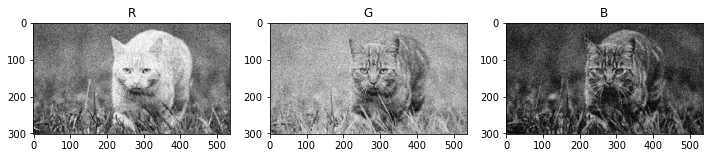

best ncomponents=20


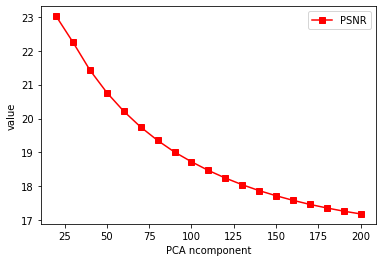

In [29]:
psnr_noisy=[]
ssm_noisy=[]
i=0
x=[]
original=I
sigma = 0.15
best_p=0
best_s=0
n_best=0
n_bests=0
noisy_or = random_noise(original, var=sigma**2)
red,green,blue =sep_RGB(noisy_or)
for n in range(20,201,10):
    x.append(n)
    pca_no=PCA_denoising(red,green,blue,n)
    p=peak_signal_noise_ratio(original, pca_no,data_range=1)
    s=structural_similarity(original, pca_no,channel_axis=-1,data_range=1)
    psnr_noisy.append(p)
    ssm_noisy.append(s)
    i+=1
    if best_p<p:
        best_p=p
        n_best=n
    if best_s<s:
        best_s=s
        n_bests=n
plt.plot(x,psnr_noisy,'s-',color = 'r',label="PSNR")#s-:方形
plt.xlabel("PCA ncomponent")
plt.ylabel("value")
plt.legend(loc = "best")
print(f'best ncomponents={n_best}')

best ncomponents=20


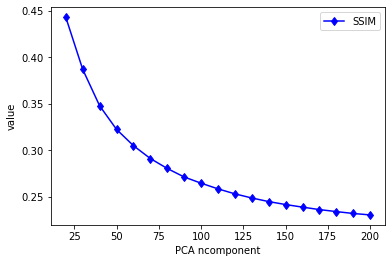

In [31]:
plt.plot(x,ssm_noisy,'d-',color = 'b',label="SSIM")#s-:方形
plt.xlabel("PCA ncomponent")
plt.ylabel("value")
plt.legend(loc = "best")
print(f'best ncomponents={n_best}')

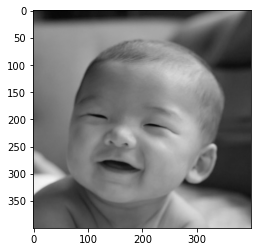

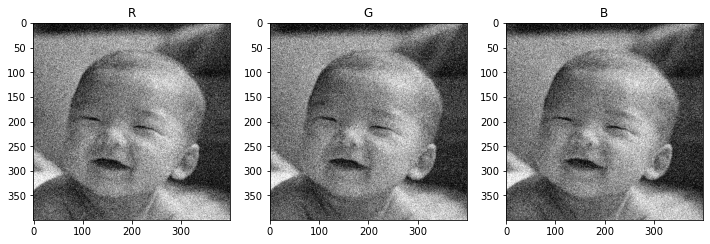

Estimated Gaussian noise standard deviation = 0.14468727923914368


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


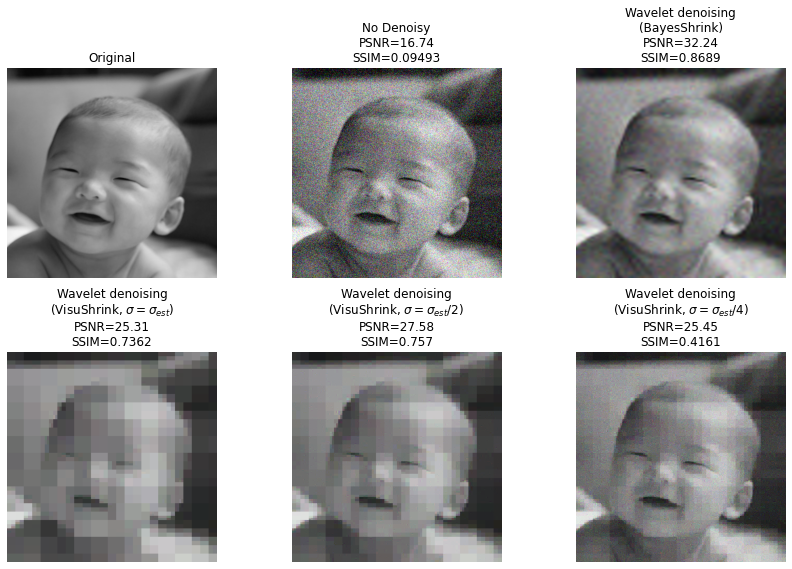

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


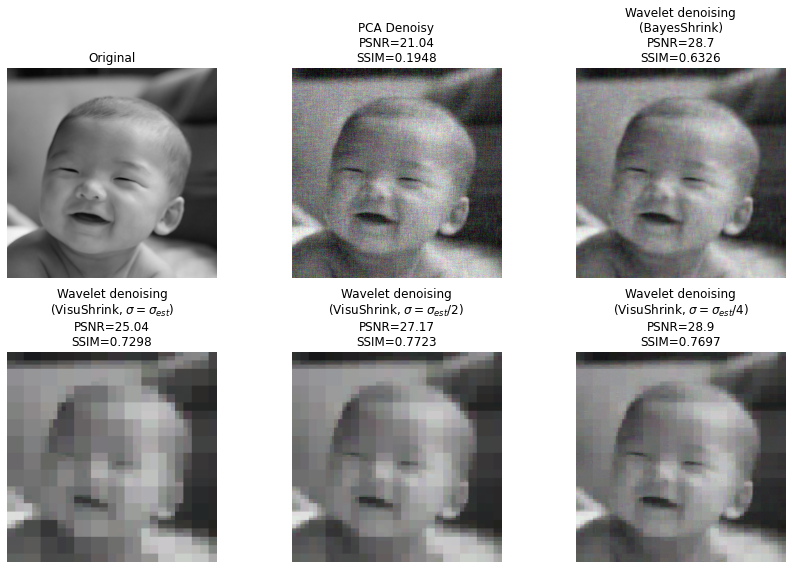

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


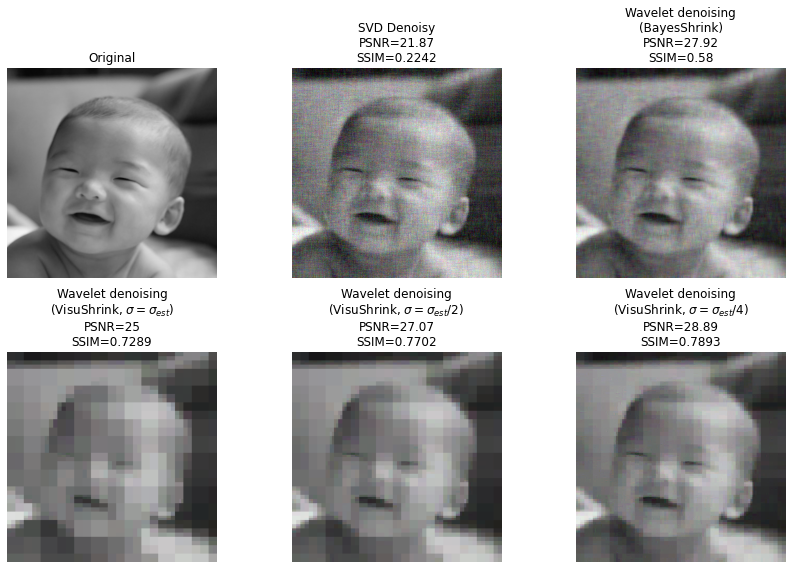

In [86]:
I = mpig.imread('image-Dante.png')[:,:,:-1]
no_b,no_visu,pca_b,pca_visu,svd_b,svd_visu=proc3D(I,50)

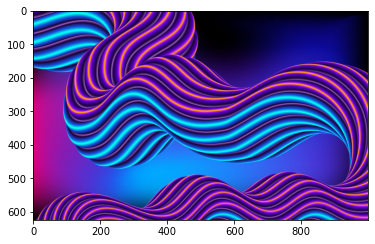

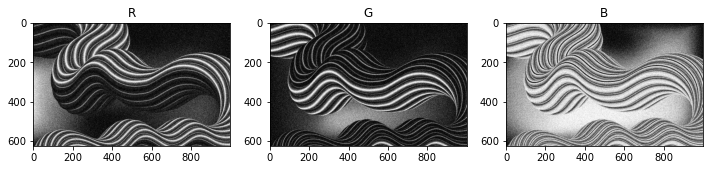

Estimated Gaussian noise standard deviation = 0.12111643684480249


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


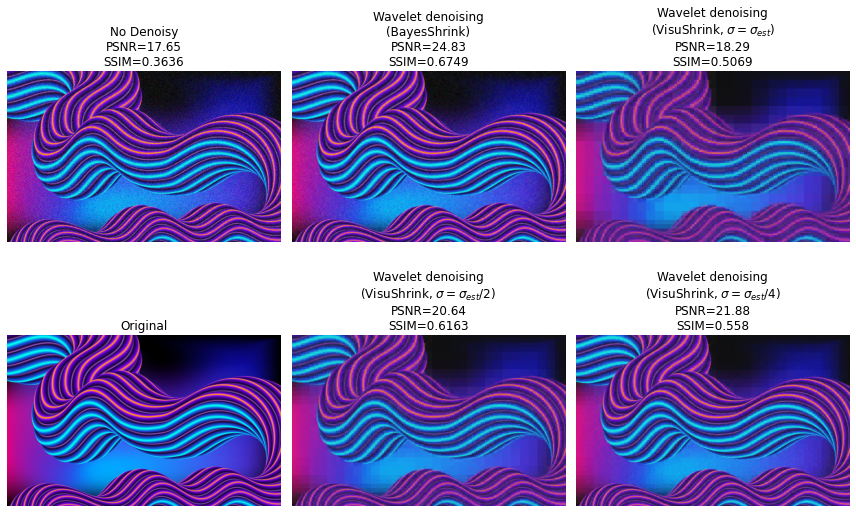

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


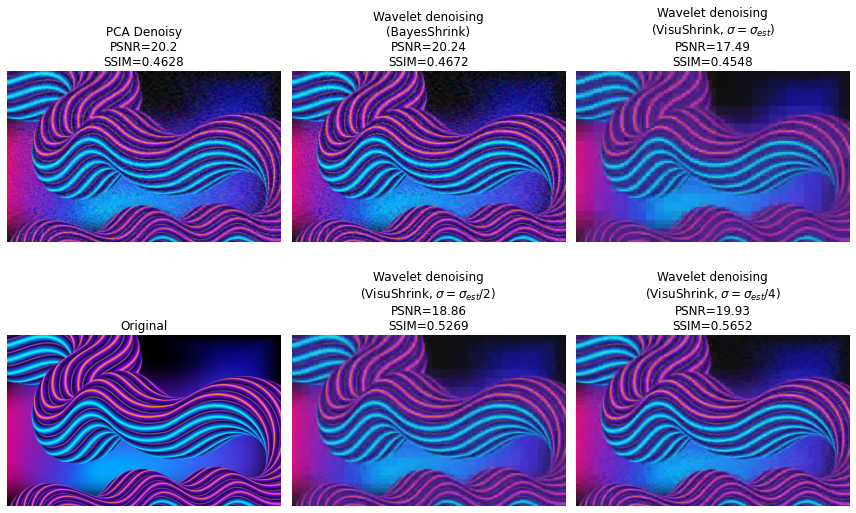

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


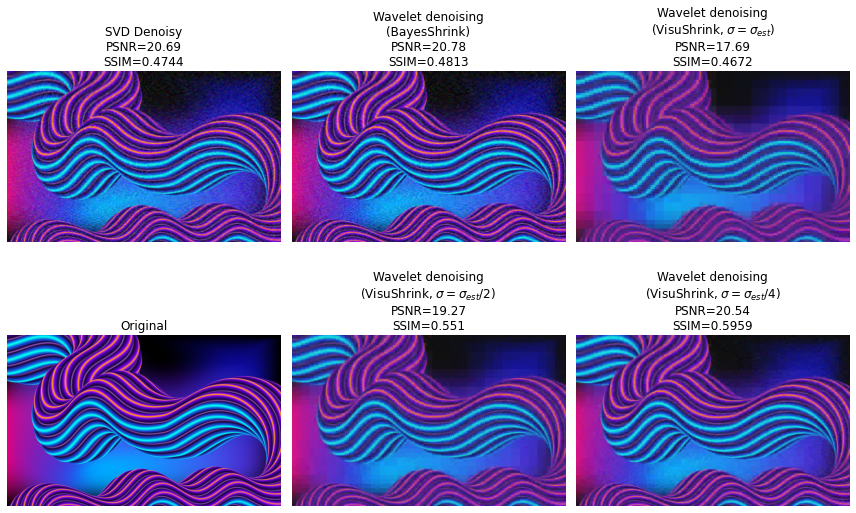

In [79]:
I=mpig.imread('wave line.jpeg')/255
no_b,no_visu,pca_b,pca_visu,svd_b,svd_visu=proc3D(I,50)

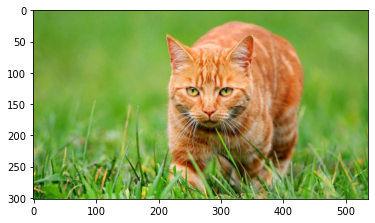

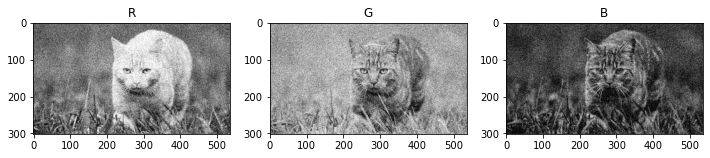

Estimated Gaussian noise standard deviation = 0.14472546945572537


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


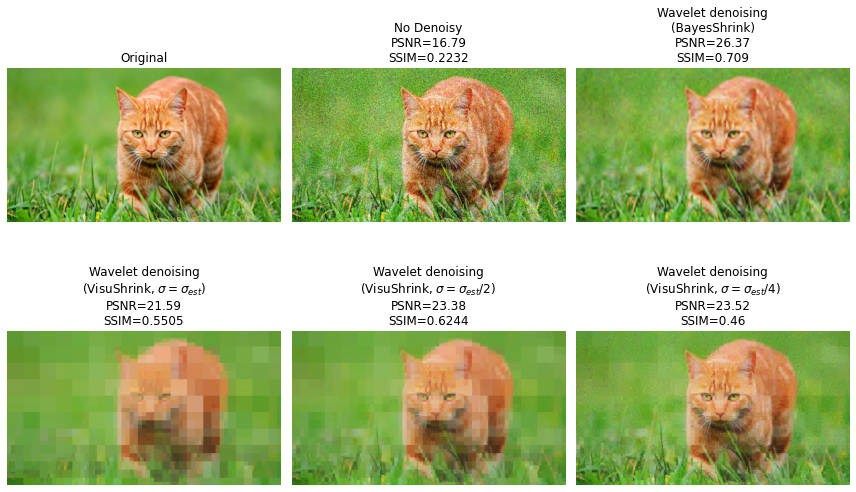

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


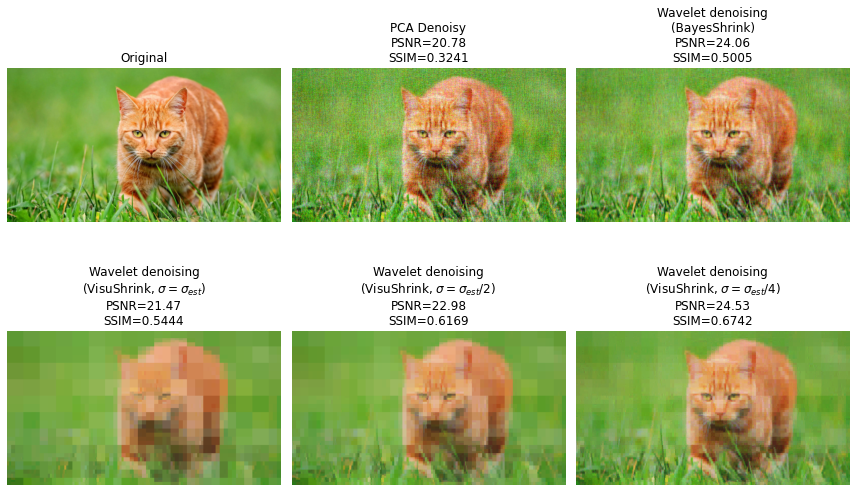

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


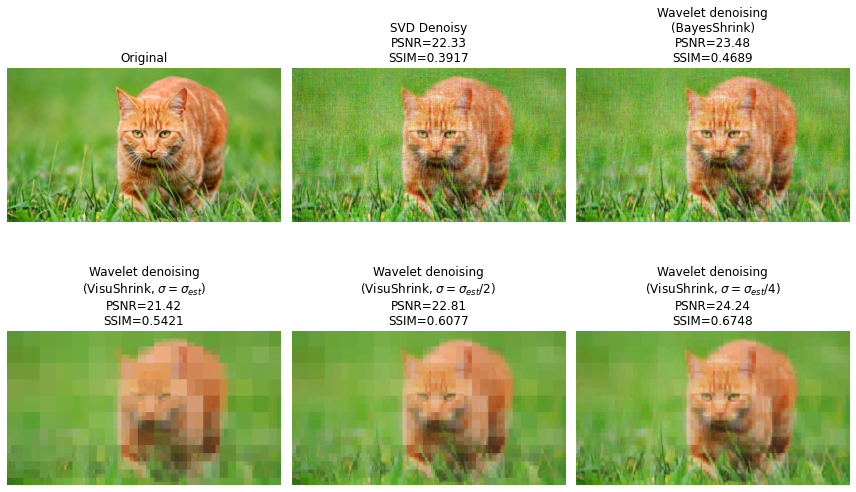

In [160]:
I = mpig.imread('cat.jpeg')/255 #pic's range scale to 0-1
no_b,no_visu,pca_b,pca_visu,svd_b,svd_visu=proc3D(I,50,'cat')

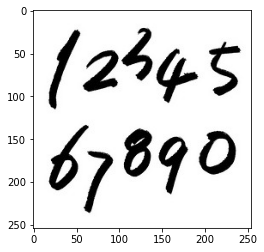

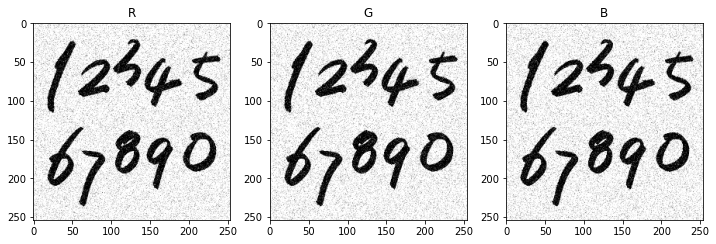

Estimated Gaussian noise standard deviation = 0.08439480299204472


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


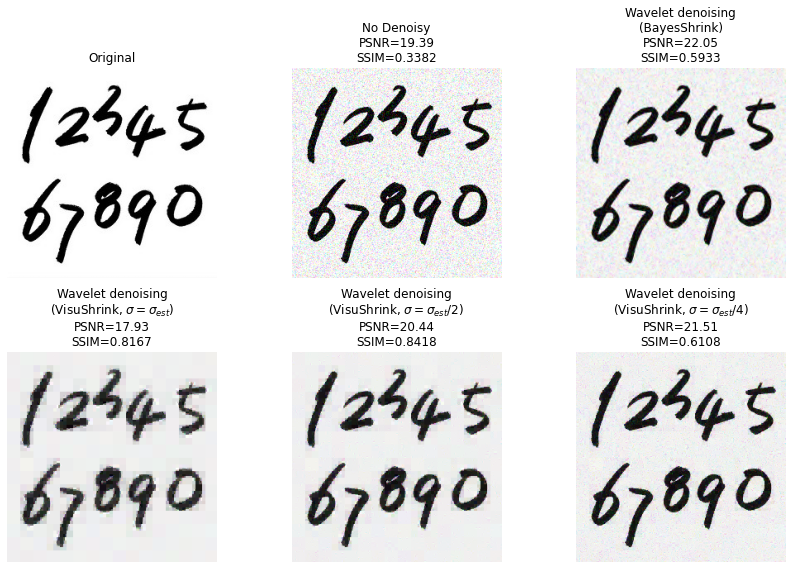

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


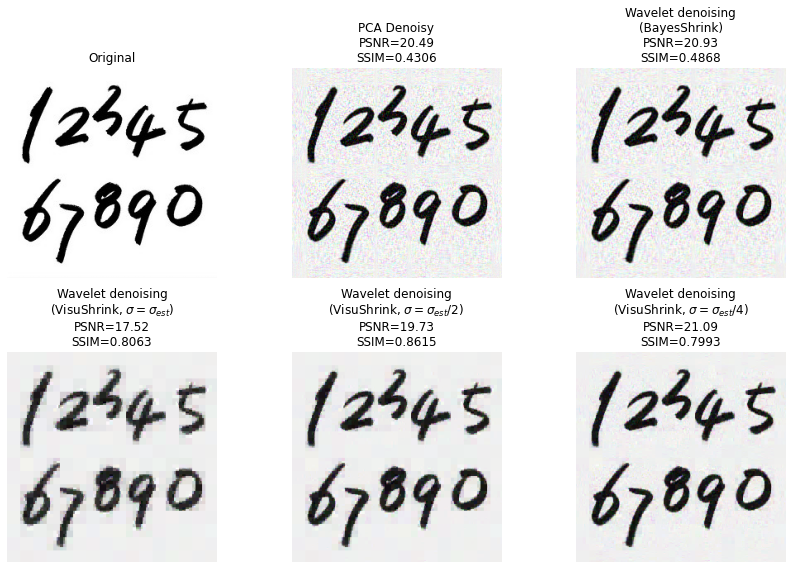

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


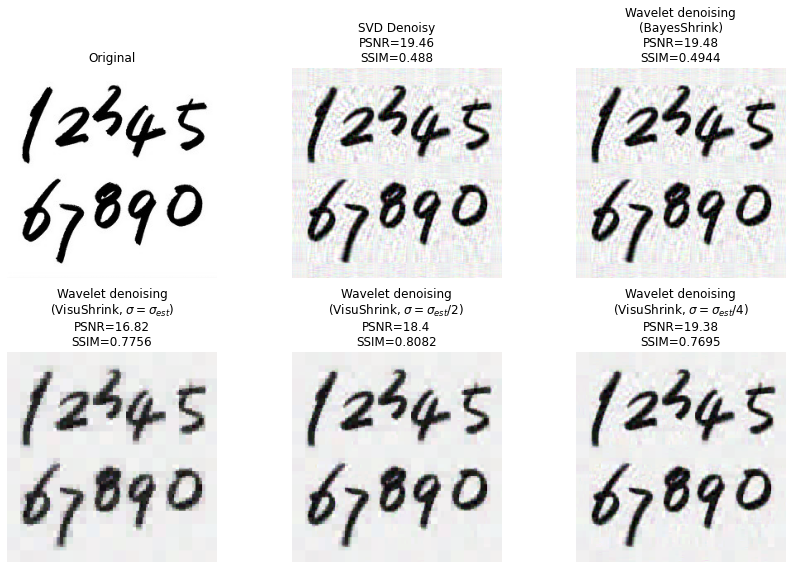

In [152]:
I = mpig.imread('handwriting.jpeg')/255
stacked_img = np.stack((I,)*3, axis=-1)
no_b,no_visu,pca_b,pca_visu,svd_b,svd_visu=proc3D(stacked_img,50,'handwriting')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


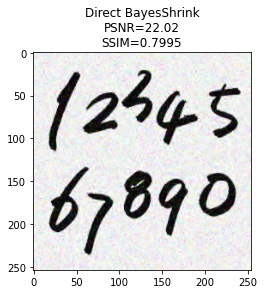

In [93]:
pic(stacked_img,no_b,'Direct BayesShrink')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


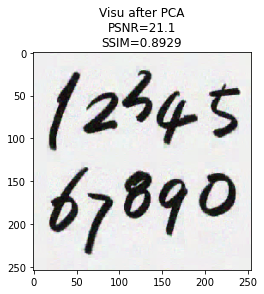

In [94]:
pic(stacked_img,pca_visu,'Visu after PCA')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


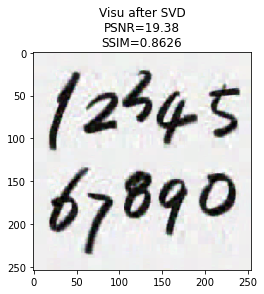

In [95]:
pic(stacked_img,svd_visu,'Visu after SVD')

# Main part

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


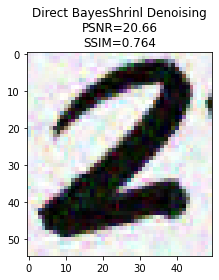

In [154]:
original=stacked_img[45:100,55:105]
x1=no_b[45:100,55:105]
psnr_bayes = peak_signal_noise_ratio(original, x1, data_range=1)
ssm_bayes = structural_similarity(original, x1,channel_axis=-1, data_range=1)
plt.imshow(x1)
plt.title(f'Direct BayesShrinl Denoising\nPSNR={psnr_bayes:0.4g}'
        '\nSSIM=%0.4g' % ssm_bayes)
plt.tight_layout()
plt.savefig('h_bays.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


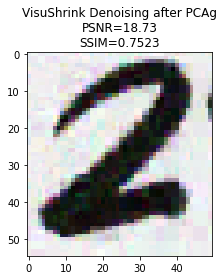

In [155]:
x2=pca_visu[45:100,55:105]
psnr = peak_signal_noise_ratio(original, x2, data_range=1)
ssm = structural_similarity(original, x2,channel_axis=-1, data_range=1)
plt.imshow(x2)
plt.title(f'VisuShrink Denoising after PCAg\nPSNR={psnr:0.4g}'
        '\nSSIM=%0.4g' % ssm)
plt.tight_layout()
plt.savefig('h_pca.png')

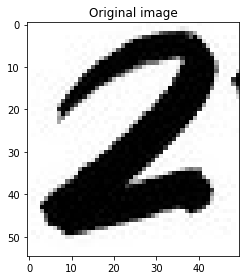

In [156]:
plt.imshow(I[45:100,55:105])
plt.title('Original image')
plt.tight_layout()
plt.savefig('h.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


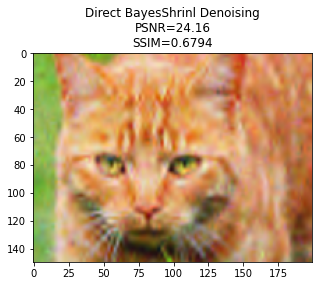

In [167]:
original=I[50:200,200:400]
x11=no_b[50:200,200:400]
psnr_bayes = peak_signal_noise_ratio(original, x11, data_range=1)
ssm_bayes = structural_similarity(original, x11,channel_axis=-1, data_range=1)
plt.figure(figsize=(5,5))
plt.imshow(x11)
plt.title(f'Direct BayesShrinl Denoising\nPSNR={psnr_bayes:0.4g}'
        '\nSSIM=%0.4g' % ssm_bayes)
plt.savefig('c_bays.png')

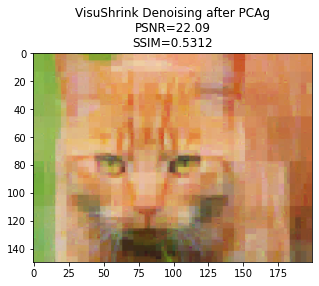

In [168]:
x12=pca_visu[50:200,200:400]
psnr = peak_signal_noise_ratio(original, x12, data_range=1)
ssm = structural_similarity(original, x12,channel_axis=-1, data_range=1)
plt.figure(figsize=(5,5))
plt.imshow(x12)
plt.title(f'VisuShrink Denoising after PCAg\nPSNR={psnr:0.4g}'
        '\nSSIM=%0.4g' % ssm)
plt.savefig('c_pca.png')

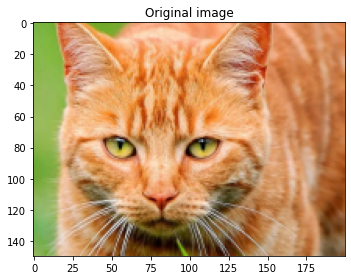

In [148]:
plt.imshow(I[50:200,200:400])
plt.title('Original image')
plt.tight_layout()
plt.savefig('c.png')

# background part

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


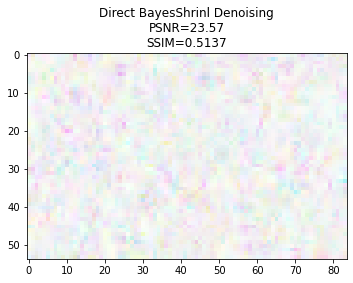

In [157]:
original=stacked_img[200:,170:]
x1=no_b[200:,170:]
psnr_bayes = peak_signal_noise_ratio(original, x1, data_range=1)
ssm_bayes = structural_similarity(original, x1,channel_axis=-1, data_range=1)
plt.imshow(x1)
plt.title(f'Direct BayesShrinl Denoising\nPSNR={psnr_bayes:0.4g}'
        '\nSSIM=%0.4g' % ssm_bayes)
plt.tight_layout()
plt.savefig('h_bays_l.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


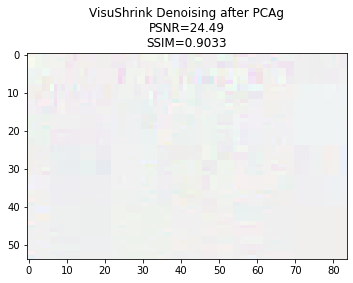

In [158]:
x2=pca_visu[200:,170:]
psnr = peak_signal_noise_ratio(original, x2, data_range=1)
ssm = structural_similarity(original, x2,channel_axis=-1, data_range=1)
plt.imshow(x2)
plt.title(f'VisuShrink Denoising after PCAg\nPSNR={psnr:0.4g}'
        '\nSSIM=%0.4g' % ssm)
plt.tight_layout()
plt.savefig('h_pca_l.png')

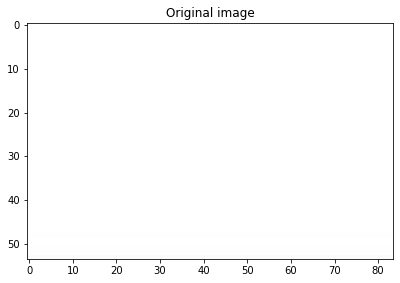

In [159]:
plt.imshow(original)
plt.title('Original image')
plt.tight_layout()
plt.savefig('h_l.png')

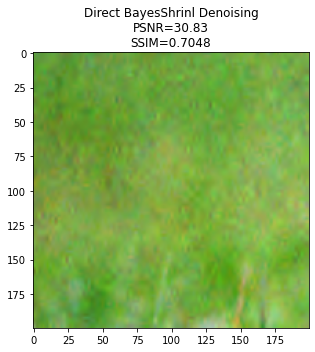

In [176]:
original=I[:200,:200]
x11=no_b[:200,:200]
psnr_bayes = peak_signal_noise_ratio(original, x11, data_range=1)
ssm_bayes = structural_similarity(original, x11,channel_axis=-1, data_range=1)
plt.figure(figsize=(5,5))
plt.imshow(x11)
plt.title(f'Direct BayesShrinl Denoising\nPSNR={psnr_bayes:0.4g}'
        '\nSSIM=%0.4g' % ssm_bayes)
plt.tight_layout()
plt.savefig('cat_bays_l.png')

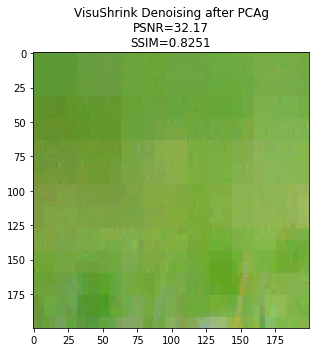

In [179]:
x12=pca_visu[:200,:200]
psnr = peak_signal_noise_ratio(original, x12, data_range=1)
ssm = structural_similarity(original, x12,channel_axis=-1, data_range=1)
plt.figure(figsize=(5,5))
plt.imshow(x12)
plt.title(f'VisuShrink Denoising after PCAg\nPSNR={psnr:0.4g}'
        '\nSSIM=%0.4g' % ssm)
plt.tight_layout()
plt.savefig('cat_pca_l.png')

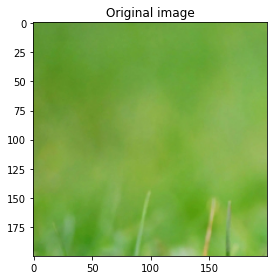

In [180]:
plt.imshow(original)
plt.title('Original image')
plt.tight_layout()
plt.savefig('cat_l.png')

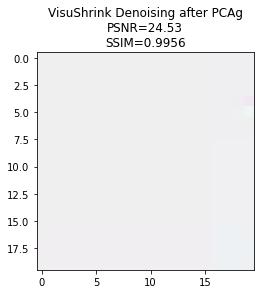

In [101]:
original=stacked_img[:20,:20]
x2=pca_visu[:20,:20]
psnr = peak_signal_noise_ratio(original, x, data_range=1)
ssm = structural_similarity(original, x,channel_axis=-1, data_range=1)
plt.imshow(x)
plt.title(f'VisuShrink Denoising after PCAg\nPSNR={psnr:0.4g}'
        '\nSSIM=%0.4g' % ssm)
plt.savefig('h_bays_l.png')


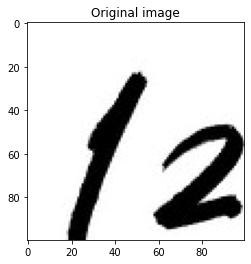

In [84]:
plt.imshow(I[:100,:100])
plt.title('Original image')
plt.savefig('h_l.png')

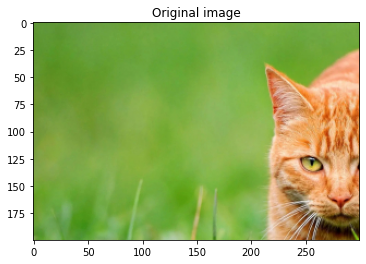

In [86]:
plt.imshow(I[:200,:300])
plt.title('Original image')
plt.savefig('cat_l.png')

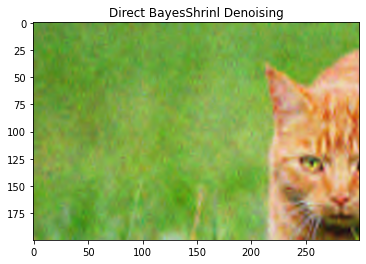

In [87]:
plt.imshow(no_b[:200,:300])
plt.title('Direct BayesShrinl Denoising')
plt.savefig('cat_bays_l.png')

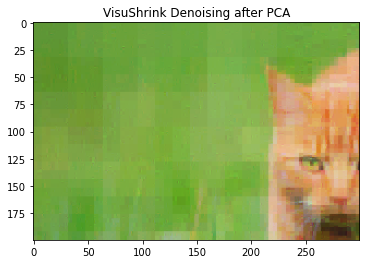

In [89]:
plt.imshow(pca_visu[:200,:300])
plt.title('VisuShrink Denoising after PCA')
plt.savefig('cat_visu_l.png')